# Setup

In [1]:
import os

In [2]:
import os
import openai
import requests
from openai import OpenAI
openai.api_key = os.environ["OPENAI_API_KEY"]
client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY"))

def llm(prompt, stop=["\n"]):
    response = client.chat.completions.create(
      model="gpt-4o",
      messages=[
        {
            "role": "user",
            "content": prompt,
        }
      ],
      temperature=0,
      max_tokens=100,
      top_p=1,
      frequency_penalty=0.0,
      presence_penalty=0.0,
      stop=stop
    )
    return response.choices[0].message.content

def llm_first_call(prompt,image, stop=["\n"]):
  response = client.chat.completions.create(
    model="gpt-4o",
    messages= [
      {
        "role": "user",
        "content": [
          {
            "type": "text",
            "text": f'{prompt}'
          },
          {
            "type": "image_url",
            "image_url": {
              "url": f"data:image/jpeg;base64,{image}"
            }
          }
        ]
      }
    ],
    temperature=0,
    max_tokens=100,
    top_p=1,
    frequency_penalty=0.0,
    presence_penalty=0.0,
    stop=["\n"]
  )
  return response.choices[0].message.content

In [3]:
import wikienv, wrappers
env = wikienv.WikiEnv()
env = wrappers.HotPotQAWrapperImage(env, split="repurposed")
env = wrappers.LoggingWrapper(env)

def step(env, action):
    attempts = 0
    while attempts < 10:
        try:
            return env.step(action)
        except requests.exceptions.Timeout:
            attempts += 1

# ReAct

In [5]:
import json
import sys
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt

folder = './prompts/'
prompt_file = 'prompts_naive.json'
with open(folder + prompt_file, 'r') as f:
    prompt_dict = json.load(f)

webthink_examples = prompt_dict['webthink_simple_image']
instruction = """Solve a question answering task, by looking at the given image, doing an ImageObserve, with interleaving Thought, Action, Observation steps. Use the provided image as context required to solve the question. Thought can reason about the current situation, and Action can be three types: 
(1) Search[entity], which searches the exact entity on Wikipedia and returns the first paragraph if it exists. If not, it will return some similar entities to search.
(2) Lookup[keyword], which returns the next sentence containing keyword in the current passage.
(3) Finish[answer], which returns the answer and finishes the task.
Here are some examples.
"""
webthink_prompt = instruction + webthink_examples

def webthink(idx=None, prompt=webthink_prompt, to_print=True, image_dataset=True) :
    (question, info) = env.reset(idx=idx, return_info=True)
    image = info['image']
    if to_print:
        print(idx, question)
    prompt += question + "\n"
    n_calls, n_badcalls = 0, 0
    for i in range(1, 8):
        n_calls += 1
        if i==1 and image_dataset==True:
            image_pic = Image.open(io.BytesIO(base64.b64decode(image)))
            plt.imshow(image_pic)
            plt.show()
            thought_action = llm_first_call(prompt + f"Thought {i}:", image=image, stop=[f"\nObservation {i}:"])
        else:
            thought_action = llm(prompt + f"Thought {i}:", stop=[f"\nObservation {i}:"])
        try:
            thought, action = thought_action.strip().split(f"\nAction {i}: ")
        except:
            print(thought_action)
            n_badcalls += 1
            n_calls += 1
            thought = thought_action.strip().split('\n')[0]
            action = llm(prompt + f"Thought {i}: {thought}\nAction {i}:", stop=[f"\n"]).strip()
        obs, r, done, info = step(env, action[0].lower() + action[1:])
        obs = obs.replace('\\n', '')
        step_str = f"Thought {i}: {thought}\nAction {i}: {action}\nObservation {i}: {obs}\n"
        prompt += step_str
        if to_print:
            print(step_str)
        if done:
            break
    if not done:
        obs, r, done, info = step(env, "finish[]")

    info.update({'n_calls': n_calls, 'n_badcalls': n_badcalls, 'traj': prompt})
    return r, info

13 Question: What animals are these?


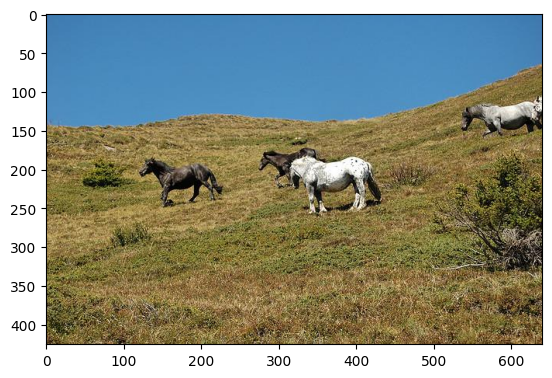

The image shows a group of horses grazing on a hillside.
Thought 1: The image shows a group of horses grazing on a hillside.
Action 1: ImageObserve 1: The image shows a group of horses grazing on a hillside.
Observation 1: Invalid action: imageObserve 1: The image shows a group of horses grazing on a hillside.

I need to identify the animals in the image. The image shows a group of horses grazing on a hillside. Therefore, the animals are horses.

Action 1: Finish[horses]
Thought 2: I need to identify the animals in the image. The image shows a group of horses grazing on a hillside. Therefore, the animals are horses.
Action 2: Finish[horses]
Observation 2: Episode finished, reward = 0


0 1 0.0 4.181967496871948
-----------

11 Question: In which country is this bus located?


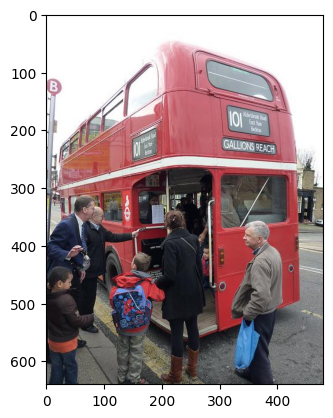

The bus in the image is a red double-decker bus, which is commonly associated with the United Kingdom, specifically London. The destination signs on the bus also indicate locations in London, such as "Aldersbrook Road," "East Ham," "Beckton," and "Gallions Reach."
Thought 1: The bus in the image is a red double-decker bus, which is commonly associated with the United Kingdom, specifically London. The destination signs on the bus also indicate locations in London, such as "Aldersbrook Road," "East Ham," "Beckton," and "Gallions Reach."
Action 1: Finish[United Kingdom]
Observation 1: Episode finished, reward = 0


0 2 0.0 4.816691756248474
-----------

26 Question: What do these pilots hope for?


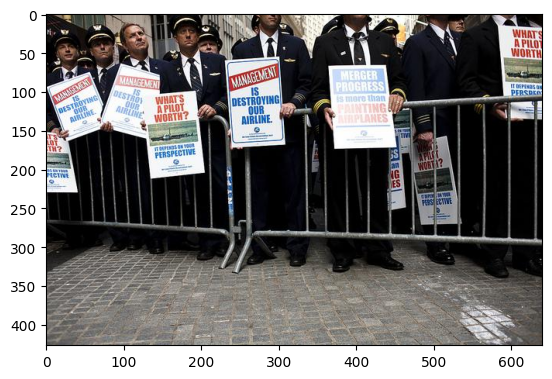

ImageObserve 1: The image shows a group of pilots holding signs that say things like "Management is destroying our airline," "Merger progress is more than painting airplanes," and "What's a pilot worth?"
Thought 1: ImageObserve 1: The image shows a group of pilots holding signs that say things like "Management is destroying our airline," "Merger progress is more than painting airplanes," and "What's a pilot worth?"
Action 1: ImageObserve 1: The image shows a group of pilots holding signs that say things like "Management is destroying our airline," "Merger progress is more than painting airplanes," and "What's a pilot worth?"
Observation 1: Invalid action: imageObserve 1: The image shows a group of pilots holding signs that say things like "Management is destroying our airline," "Merger progress is more than painting airplanes," and "What's a pilot worth?"

The pilots are holding signs that express their dissatisfaction with management and the progress of a merger. They seem to be advoc

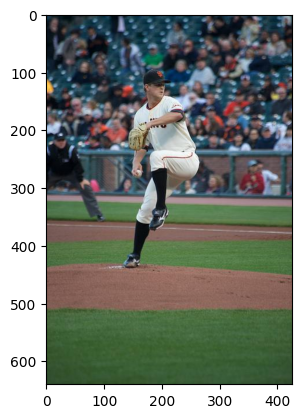

ImageObserve 1: The image shows a baseball player pitching on a baseball field.
Thought 1: ImageObserve 1: The image shows a baseball player pitching on a baseball field.
Action 1: Search[2019 baseball championship winner]
Observation 1: Could not find 2019 baseball championship winner. Similar: ['2019 Asian Baseball Championship', '2019 African Baseball Championship', 'American League Championship Series', 'National League Championship Series', 'Major League Baseball postseason'].

Thought 2: I need to refine my search to find the specific championship winner for Major League Baseball in 2019.
Action 2: Search[2019 Major League Baseball championship winner]
Observation 2: Could not find 2019 Major League Baseball championship winner. Similar: ['Major League Baseball postseason', 'Major League Baseball division winners', '2019 Major League Baseball season', 'Major League Baseball Wild Card', '2019 Major League Baseball postseason'].

Thought 3: I need to search for the 2019 World Serie

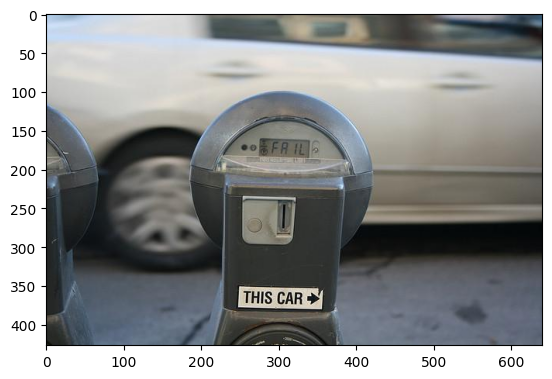

The meter in the image is pointing towards the right, as indicated by the arrow and the text "THIS CAR" on the meter. 
Thought 1: The meter in the image is pointing towards the right, as indicated by the arrow and the text "THIS CAR" on the meter.
Action 1: Finish[right]
Observation 1: Episode finished, reward = 1


2 5 0.4 6.043537616729736
-----------

18 Question: What type of gathering is this?


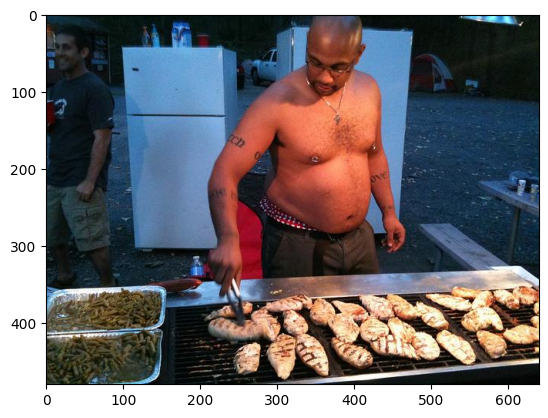

ImageObserve 1: The image shows a person grilling a large amount of food outdoors, with other people and camping equipment visible in the background.
Thought 1: ImageObserve 1: The image shows a person grilling a large amount of food outdoors, with other people and camping equipment visible in the background.
Action 1: ImageObserve 1: The image shows a person grilling a large amount of food outdoors, with other people and camping equipment visible in the background.
Observation 1: Invalid action: imageObserve 1: The image shows a person grilling a large amount of food outdoors, with other people and camping equipment visible in the background.

The image shows a person grilling a large amount of food outdoors, with other people and camping equipment visible in the background. This suggests that the gathering is likely a barbecue or a cookout, possibly in a camping setting.

Action 1: Finish[barbecue or cookout]
Thought 2: The image shows a person grilling a large amount of food outdoor

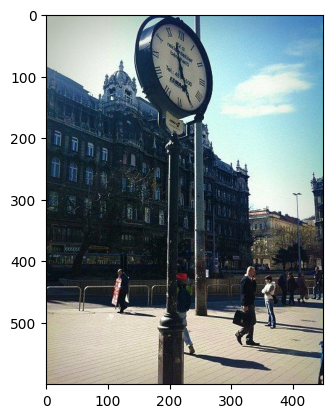

The image shows a clock in an urban setting with people walking around. The clock indicates the time is approximately 10:10. The lighting and shadows suggest it is daytime.
Thought 1: The image shows a clock in an urban setting with people walking around. The clock indicates the time is approximately 10:10. The lighting and shadows suggest it is daytime.
Action 1: ImageObserve 1: The image shows a clock in an urban setting with people walking around. The clock indicates the time is approximately 10:10. The lighting and shadows suggest it is daytime.
Observation 1: Invalid action: imageObserve 1: The image shows a clock in an urban setting with people walking around. The clock indicates the time is approximately 10:10. The lighting and shadows suggest it is daytime.

I need to determine the period of the day depicted in the photo based on the time shown on the clock and the lighting conditions. The clock shows 10:10, and the lighting suggests it is daytime. Therefore, the period of the 

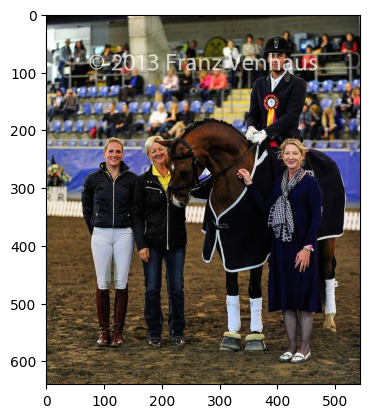

ImageObserve 1: The image shows a person on a horse with a ribbon, indicating a competition, and other people standing beside them. This suggests it might be an equestrian event.
Thought 1: ImageObserve 1: The image shows a person on a horse with a ribbon, indicating a competition, and other people standing beside them. This suggests it might be an equestrian event.
Action 1: Search[equestrian event]
Observation 1: Could not find equestrian event. Similar: ['Equestrian events at the Summer Paralympics', 'Equestrian events at the Summer Olympics', 'List of equestrian sports', 'List of Olympic medalists in equestrian events', 'Equestrian events at the 2024 Summer Paralympics'].

Thought 2: The search for "equestrian event" did not yield a direct result. I should refine my search to find the specific type of equestrian race shown in the image.

Action 2: Search[equestrian sports]
Observation 2: Equestrian sports are sports that use horses as a main part of the sport. This usually takes th

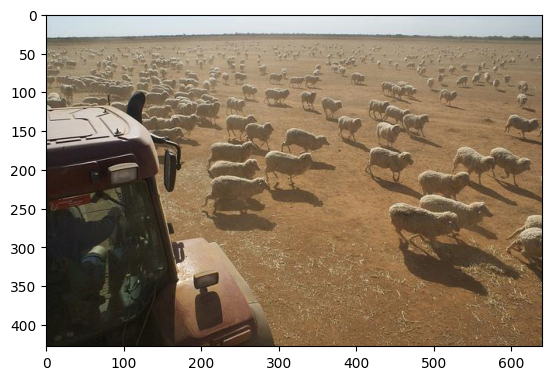

The image shows a person driving a vehicle in a field with a large number of sheep. This suggests that the person is likely involved in agriculture or livestock management.
Thought 1: The image shows a person driving a vehicle in a field with a large number of sheep. This suggests that the person is likely involved in agriculture or livestock management.
Action 1: ImageObserve 1: The image shows a person driving a vehicle in a field with a large number of sheep. This suggests that the person is likely involved in agriculture or livestock management.
Observation 1: Invalid action: imageObserve 1: The image shows a person driving a vehicle in a field with a large number of sheep. This suggests that the person is likely involved in agriculture or livestock management.

I need to identify the occupation of the person driving the vehicle in the field with a large number of sheep. Given the context, the person is likely involved in a profession related to sheep farming or livestock managemen

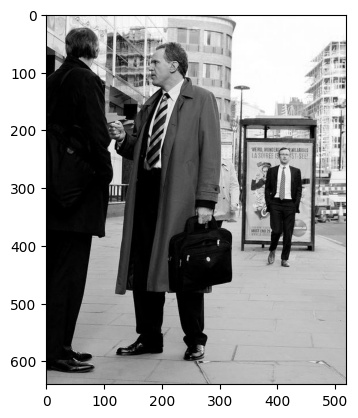

The image shows a poster advertisement at a bus stop. 
Thought 1: The image shows a poster advertisement at a bus stop.
Action 1: Finish[bus stop]
Observation 1: Episode finished, reward = 0


3 10 0.3 5.81104154586792
-----------

12 Question: When did the namesake of this theater die?


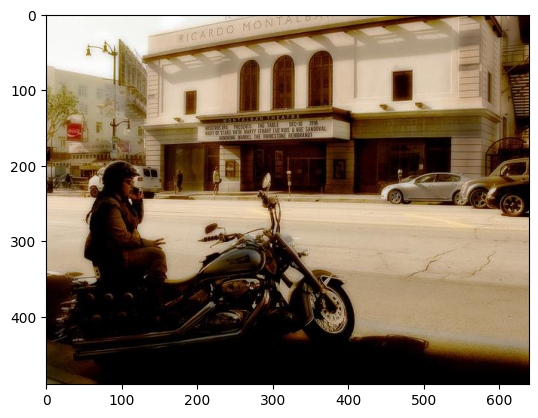

The image shows the Ricardo Montalbán Theatre. To find out when the namesake of this theater, Ricardo Montalbán, died, I need to search for Ricardo Montalbán.
Thought 1: The image shows the Ricardo Montalbán Theatre. To find out when the namesake of this theater, Ricardo Montalbán, died, I need to search for Ricardo Montalbán.
Action 1: Search[Ricardo Montalbán]
Observation 1: Ricardo Gonzalo Pedro Montalbán y Merino, KSG (/ˌmɒntəlˈbɑːn/ MON-təl-BAHN; Spanish: [montalˈβan]; November 25, 1920 – January 14, 2009) was a Mexican and American film and television actor. Montalbán's career spanned seven decades, during which he became widely known for performances in genres from crime and drama to musicals and comedy.. Later in his career, Montalbán portrayed Armando in the Planet of the Apes film series from the early 1970s, starring in both Escape from the Planet of the Apes (1971) and Conquest of the Planet of the Apes (1972). As the villain Khan Noonien Singh, a genetically enhanced human

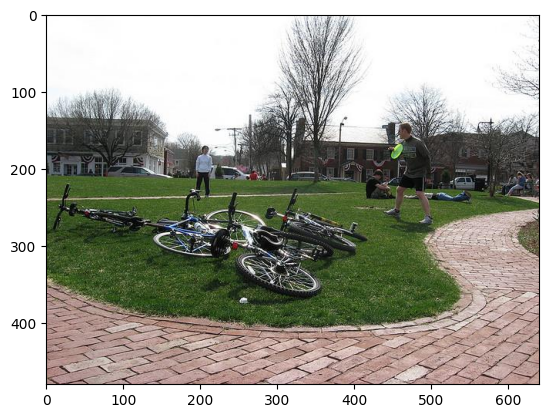

ImageObserve 1: The image shows a group of people playing frisbee in a park. There are several bicycles lying on the grass nearby.
Thought 1: ImageObserve 1: The image shows a group of people playing frisbee in a park. There are several bicycles lying on the grass nearby.
Action 1: ImageObserve 1: The image shows a group of people playing frisbee in a park. There are several bicycles lying on the grass nearby.
Observation 1: Invalid action: imageObserve 1: The image shows a group of people playing frisbee in a park. There are several bicycles lying on the grass nearby.

The image shows a group of people playing frisbee in a park, and there are several bicycles lying on the grass nearby. This suggests that the frisbee throwers likely used bicycles to get to this location.

Action 1: Finish[They likely used bicycles to get to this location.]
Thought 2: The image shows a group of people playing frisbee in a park, and there are several bicycles lying on the grass nearby. This suggests that

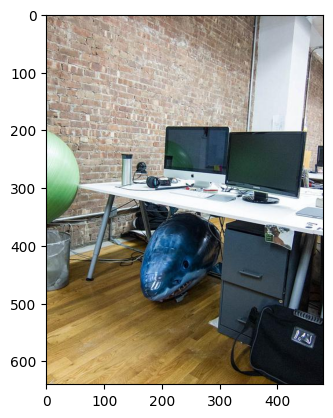

ImageObserve 1: The animal under the desk appears to be a shark.
Thought 1: ImageObserve 1: The animal under the desk appears to be a shark.
Action 1: Search[song mentions shark]
Observation 1: Could not find song mentions shark. Similar: ['Baby Shark', 'Jon Hein (redirect from JumptheShark.com)', "Robbin' the Hood (redirect from Steppin' Razor (Sublime song))", 'Meg 2: The Trench (category Films about shark attacks)', '90210 (song)'].

Thought 2: I need to refine my search to find a specific song that mentions a shark. "Baby Shark" is a well-known song that mentions a shark, so I should look into that.

Action 2: Search[Baby Shark]
Observation 2: "Baby Shark" (Korean: 상어가족) is a children's song associated with a dance involving hand movements dating back to the late 20th century. In 2016, "Baby Shark" became very popular when Pinkfong, a South Korean entertainment company, released a version of the song on June 17, 2016, with a YouTube music video which went viral in social media, onl

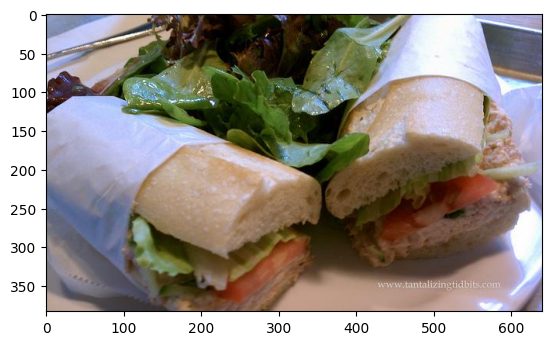

ImageObserve 1: The image shows a sandwich with vegetables and a side salad. This is a typical human meal.
Thought 1: ImageObserve 1: The image shows a sandwich with vegetables and a side salad. This is a typical human meal.
Action 1: Finish[human]
Observation 1: Episode finished, reward = 1


5 14 0.35714285714285715 5.251520429338727
-----------

14 Question: What kind of cake has been served?


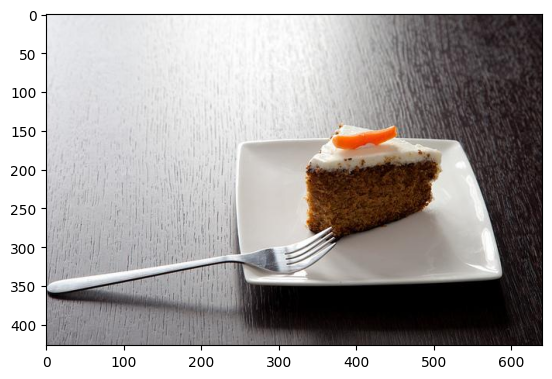

ImageObserve 1: The image shows a slice of cake with a white frosting and an orange garnish on top. The cake appears to be brownish in color.
Thought 1: ImageObserve 1: The image shows a slice of cake with a white frosting and an orange garnish on top. The cake appears to be brownish in color.
Action 1: ImageObserve 1: The image shows a slice of cake with a white frosting and an orange garnish on top. The cake appears to be brownish in color.
Observation 1: Invalid action: imageObserve 1: The image shows a slice of cake with a white frosting and an orange garnish on top. The cake appears to be brownish in color.

I need to identify the type of cake based on its appearance. The cake has white frosting and an orange garnish on top, and the cake itself appears to be brownish in color. This could be indicative of a specific type of cake.

Action 1: Search[cake with white frosting and orange garnish]

Observation 1: The search did not yield specific results. I need to refine my search to in

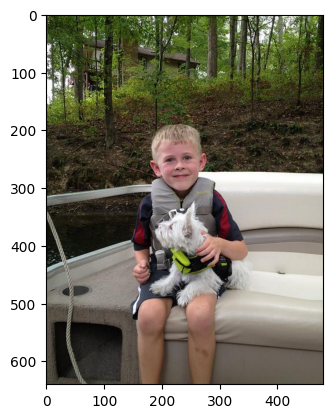

ImageObserve 1: The image shows a small white dog with a child on a boat. The dog appears to be a small breed with a fluffy coat.
Thought 1: ImageObserve 1: The image shows a small white dog with a child on a boat. The dog appears to be a small breed with a fluffy coat.
Action 1: Action 1: Search[small white dog breed fluffy coat]
Observation 1: Invalid action: action 1: Search[small white dog breed fluffy coat]

Thought 2: I need to refine my search to find the specific breed of the dog in the image. 

Action 2: Search[small white dog breeds]
Observation 2: Could not find small white dog breeds. Similar: ['Pomeranian dog', 'List of dog breeds', 'Maltese dog', 'Boxer (dog breed)', 'Akita (dog breed)'].

Thought 3: I should search for one of the similar entities that might match the dog in the image. The Maltese dog is a small white breed with a fluffy coat, which seems to fit the description.

Action 3: Search[Maltese dog]
Observation 3: Maltese dog refers both to an ancient variety of

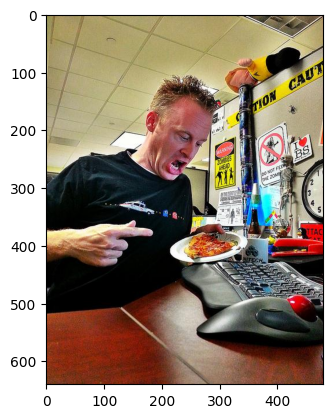

The man in the image is eating pizza at his desk in an office environment.
Thought 1: The man in the image is eating pizza at his desk in an office environment.
Action 1: Finish[at his desk in an office environment]
Observation 1: Episode finished, reward = 0


5 17 0.29411764705882354 5.348757729810827
-----------

24 Question: What is the cat growling at?


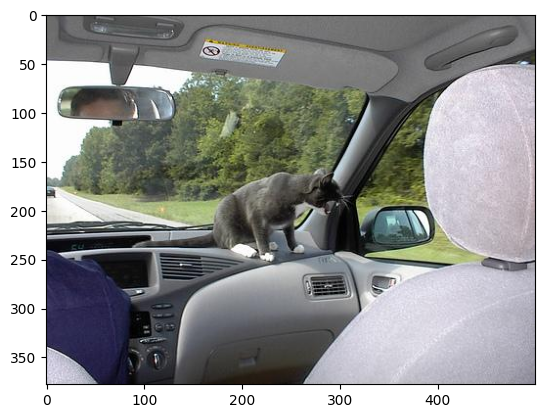

The cat in the image is growling at something outside the car window. It appears to be looking intently at something on the side of the road or in the surrounding area. 
Thought 1: The cat in the image is growling at something outside the car window. It appears to be looking intently at something on the side of the road or in the surrounding area.
Action 1: ImageObserve 1: The image shows a cat inside a car, looking out the window with a growling expression. There is a dog outside the car window, which seems to be the focus of the cat's attention.
Observation 1: Invalid action: imageObserve 1: The image shows a cat inside a car, looking out the window with a growling expression. There is a dog outside the car window, which seems to be the focus of the cat's attention.

Thought 2: The cat in the image is growling at a dog outside the car window. The cat's expression and focus are directed towards the dog, indicating that the dog is the source of its growling.

Action 2: Finish[The cat i

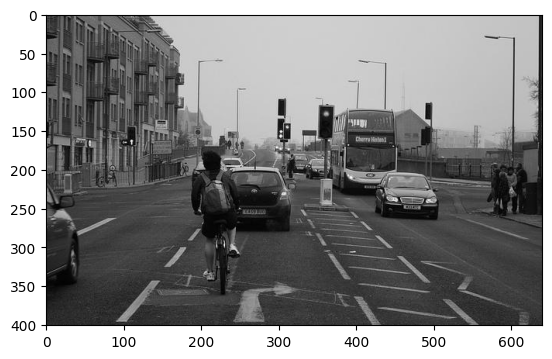

The image shows a road with traffic lights, cars, a bus, and a cyclist. The traffic lights are red, indicating that vehicles must stop.
Thought 1: The image shows a road with traffic lights, cars, a bus, and a cyclist. The traffic lights are red, indicating that vehicles must stop.
Action 1: ImageObserve 1: The image shows a road with traffic lights, cars, a bus, and a cyclist. The traffic lights are red, indicating that vehicles must stop.
Observation 1: Invalid action: imageObserve 1: The image shows a road with traffic lights, cars, a bus, and a cyclist. The traffic lights are red, indicating that vehicles must stop.

Thought 2: The image shows a road with traffic lights, cars, a bus, and a cyclist. The traffic lights are red, indicating that vehicles must stop. Therefore, if the cameraman were driving, they would have to stop at the red light.

Action 2: Finish[stop at the red light]
Observation 2: Episode finished, reward = 0


5 19 0.2631578947368421 5.259959710271735
-----------

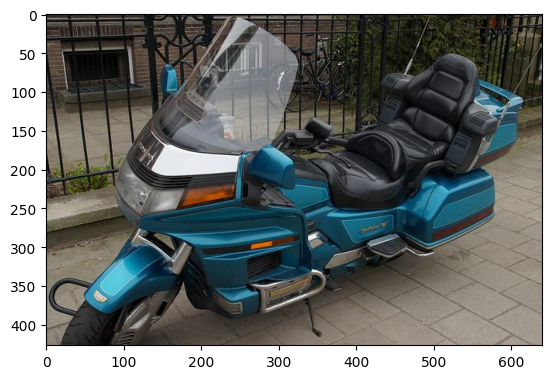

The motorcycle in the image appears to be a touring motorcycle with two seats: one for the rider and one for a passenger. 
Thought 1: The motorcycle in the image appears to be a touring motorcycle with two seats: one for the rider and one for a passenger.
Action 1: ImageObserve 1: The image shows a motorcycle with two seats, one for the rider and one for a passenger.
Observation 1: Invalid action: imageObserve 1: The image shows a motorcycle with two seats, one for the rider and one for a passenger.

Thought 2: I need to determine the number of people who can ride the motorcycle shown in the image. The image shows a motorcycle with two seats, which typically means it can accommodate two people: one rider and one passenger.

Action 2: Finish[2]
Observation 2: Episode finished, reward = 0


5 20 0.25 5.172201097011566
-----------

2 Question: How were the drivers of the cars able to park here?


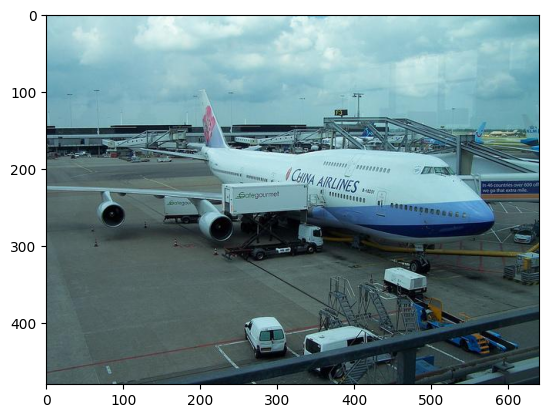

ImageObserve 1: The image shows a China Airlines airplane parked at an airport gate, with several vehicles parked nearby.
Thought 1: ImageObserve 1: The image shows a China Airlines airplane parked at an airport gate, with several vehicles parked nearby.
Action 1: ImageObserve 1: The image shows a China Airlines airplane parked at an airport gate, with several vehicles parked nearby.
Observation 1: Invalid action: imageObserve 1: The image shows a China Airlines airplane parked at an airport gate, with several vehicles parked nearby.

I need to carefully observe the image to understand how the drivers of the cars were able to park there.

ImageObserve 2: The image shows a China Airlines airplane parked at an airport gate, with several vehicles parked nearby, including some on the tarmac close to the airplane.

Thought 2: The vehicles are parked on the tarmac, which is a restricted area typically accessible only to authorized personnel. This suggests that the drivers of the cars are lik

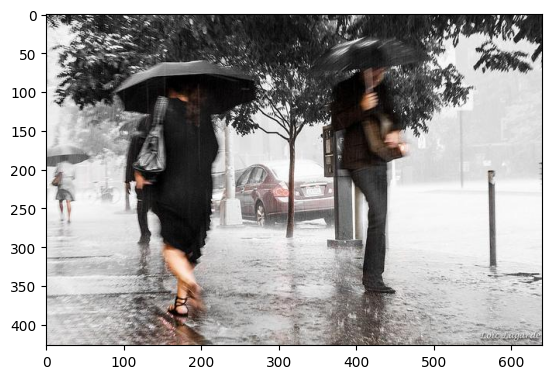

ImageObserve 1: The image shows people walking in heavy rain with umbrellas. The rain appears to be intense and continuous.
Thought 1: ImageObserve 1: The image shows people walking in heavy rain with umbrellas. The rain appears to be intense and continuous.
Action 1: Search[types of rain]
Observation 1: Could not find types of rain. Similar: ['Rain gauge', 'Precipitation types', 'Rain', 'Nimbostratus cloud (redirect from Rain cloud)', 'Risk of Rain'].

Thought 2: I need to refine my search to find the specific type of rain shown in the image, which appears to be heavy and continuous. 

Action 2: Search[heavy continuous rain]
Observation 2: Could not find heavy continuous rain. Similar: ['October 2015 North American storm complex', 'Altostratus cloud', 'Rain', 'Grütt Landscape Park', 'Nimbostratus cloud (redirect from Rain cloud)'].

Thought 3: I need to refine my search further to find the specific type of rain that is heavy and continuous. 

Action 3: Search[types of heavy rain]
Obse

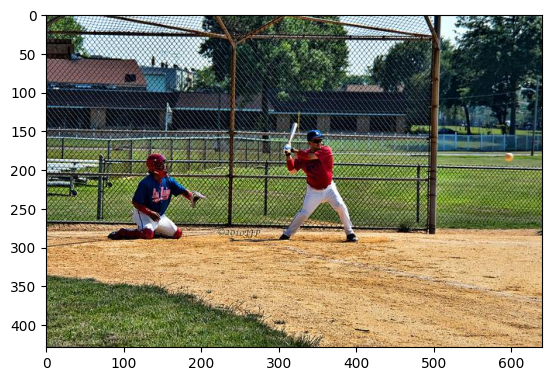

The image shows a baseball game with a batter and a catcher. The batter is in the process of swinging the bat, indicating that the batter is the one who last gave force to the ball.
Thought 1: The image shows a baseball game with a batter and a catcher. The batter is in the process of swinging the bat, indicating that the batter is the one who last gave force to the ball.
Action 1: Finish[the batter]
Observation 1: Episode finished, reward = 0


5 23 0.21739130434782608 5.552598756292592
-----------

15 Question: What kind of computer is near the woman in blue?


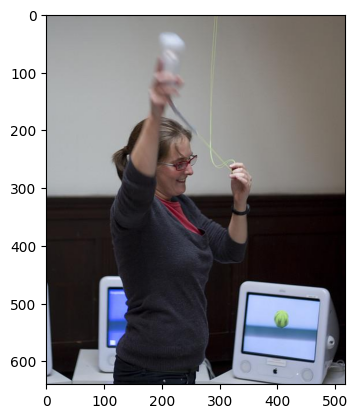

The image shows a woman in blue near a computer. The computer appears to be an Apple iMac G4, which is recognizable by its distinctive design with a hemispherical base and a flat panel display mounted on an adjustable arm.
Thought 1: The image shows a woman in blue near a computer. The computer appears to be an Apple iMac G4, which is recognizable by its distinctive design with a hemispherical base and a flat panel display mounted on an adjustable arm.
Action 1: Finish[Apple iMac G4]
Observation 1: Episode finished, reward = 0


5 24 0.20833333333333334 5.4314993023872375
-----------

7 Question: What is the man putting on the bus?


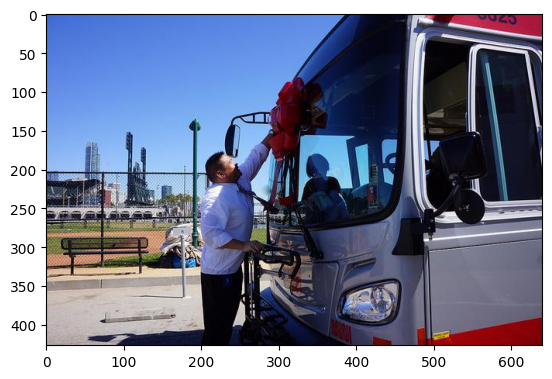

The man is putting a large red bow on the bus.
Thought 1: The man is putting a large red bow on the bus.
Action 1: Finish[a large red bow]
Observation 1: Episode finished, reward = 0


5 25 0.2 5.309484052658081
-----------

16 Question: What job do the people shown here share?


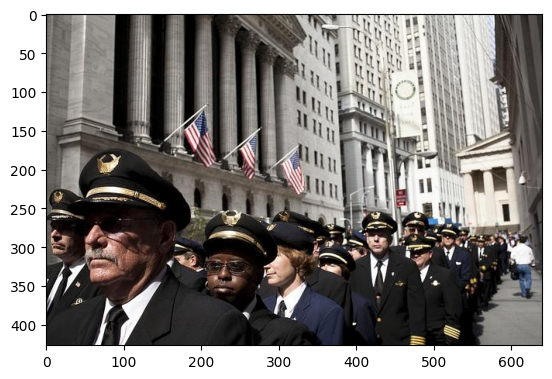

ImageObserve 1: The people in the image are wearing uniforms that resemble those of pilots.
Thought 1: ImageObserve 1: The people in the image are wearing uniforms that resemble those of pilots.
Action 1: Search[pilot]
Observation 1: An aircraft pilot or aviator is a person who controls the flight of an aircraft by operating its directional flight controls. Some other aircrew members, such as navigators or flight engineers, are also considered aviators because they are involved in operating the aircraft's navigation and engine systems. Other aircrew members, such as drone operators, flight attendants, mechanics and ground crew, are not classified as aviators.. In recognition of the pilots' qualifications and responsibilities, most militaries and many airlines worldwide award aviator badges to their pilots.. The first recorded use of the term aviator (aviateur in French) was in 1887, as a variation of aviation, from the Latin avis (meaning bird), coined in 1863 by G.

Thought 2: The obs

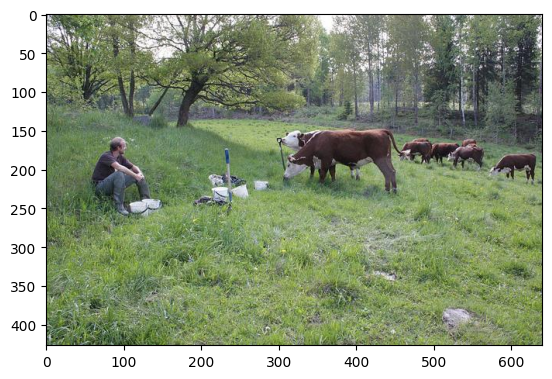

The image shows cows grazing in a green field with a person sitting nearby. The cows appear to be calmly eating grass, and the environment looks peaceful and serene.
Thought 1: The image shows cows grazing in a green field with a person sitting nearby. The cows appear to be calmly eating grass, and the environment looks peaceful and serene.
Action 1: Finish[The cows seem to be in a calm and peaceful mood.]
Observation 1: Episode finished, reward = 0


5 27 0.18518518518518517 5.155325439241198
-----------

20 Question: What letter appears twice in a row on the train?


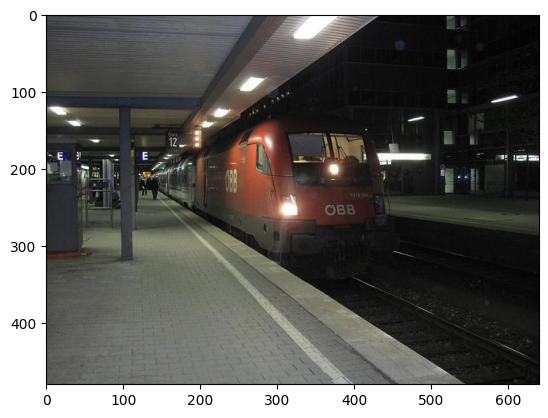

ImageObserve 1: The train in the image has the letters "ÖBB" written on it.
Thought 1: ImageObserve 1: The train in the image has the letters "ÖBB" written on it.
Action 1: Finish[B]
Observation 1: Episode finished, reward = 1


6 28 0.21428571428571427 5.059002007756915
-----------

25 Question: What sort of building is seen behind this amusement?


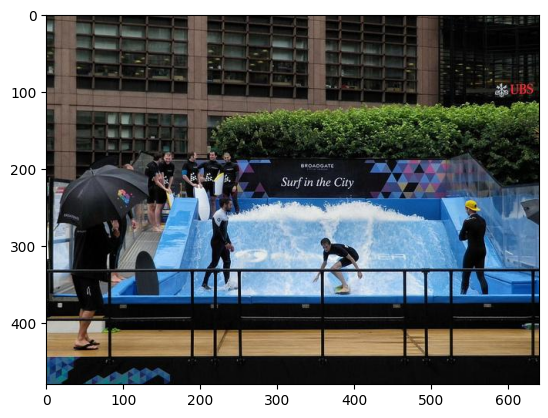

The image shows an amusement setup for surfing, labeled "Surf in the City," with a building in the background. The building has a modern, corporate appearance with large windows and a UBS logo visible on the top right corner.
Thought 1: The image shows an amusement setup for surfing, labeled "Surf in the City," with a building in the background. The building has a modern, corporate appearance with large windows and a UBS logo visible on the top right corner.
Action 1: Search[UBS building]
Observation 1: Could not find UBS building. Similar: ['UBS', 'UBS (disambiguation)', 'Massive Attack', 'Swiss Bank Corporation (category UBS)', '5 Broadgate (category UBS)'].

Thought 2: The search for "UBS building" did not yield specific results. However, UBS is a well-known financial services company, so the building is likely an office building or corporate headquarters.

Action 2: Finish[office building or corporate headquarters]
Observation 2: Episode finished, reward = 0


6 29 0.20689655172413

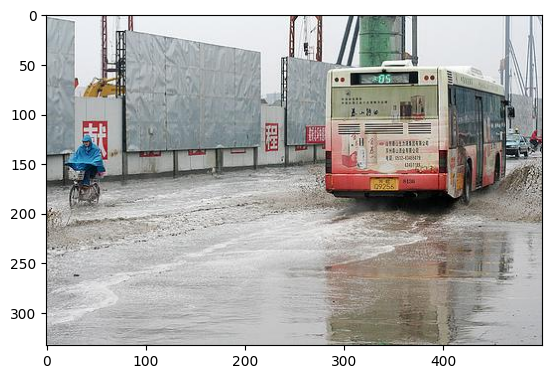

The image shows a flooded street with a bus and a person on a bicycle. 
Thought 1: The image shows a flooded street with a bus and a person on a bicycle.
Action 1: ImageObserve 1: The image shows a flooded street with a bus and a person on a bicycle.
Observation 1: Invalid action: imageObserve 1: The image shows a flooded street with a bus and a person on a bicycle.

I need to determine which object is in the greatest danger based on the image showing a flooded street with a bus and a person on a bicycle.

Thought 1: The person on the bicycle is more vulnerable in a flood compared to the bus, which is larger and more stable.

Action 1: Finish[The person on the bicycle]
Thought 2: I need to determine which object is in the greatest danger based on the image showing a flooded street with a bus and a person on a bicycle.
Action 2: ImageObserve 2: The image shows a flooded street with a bus and a person on a bicycle. The water level appears to be quite high, and the person on the bicycle i

In [7]:
import random
import time
idxs = list(range(30))
random.Random(233).shuffle(idxs)

rs = []
infos = []
old_time = time.time()
for i in idxs:
    r, info = webthink(i, to_print=True, image_dataset=True) # comment out image_dataset=True if you have to remove
    rs.append(info['em'])
    infos.append(info)
    print(sum(rs), len(rs), sum(rs) / len(rs), (time.time() - old_time) / len(rs))
    print('-----------')
    print()